# Libraries

In [1]:
# Obtaining data from the web
import requests
from bs4 import BeautifulSoup
from urllib.request import urlopen

# Formatting & Parsing
import json
import pandas as pd
import geopandas as gpd
import pyproj
import numpy as np
from zipfile import ZipFile
import json
from io import BytesIO
from io import StringIO

# data visualization
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import plotly.express as px

# misc
import os
from tqdm import tqdm
from datetime import date

# Intro

There are many jobs available in Indeed.ca, so we are going to isolate our searches to only jobs containing the word "data". I am hoping to obtain some indication of:

1. Which types of data roles are in demand?
2. How many fully-remote jobs are there?
3. What level of experience is needed?
4. What skills are most in demand?
5. Other characteristics such as location, salary, benefits & the types of companies that are hiring.

# Setting up methods to obtain the data

In order to scrape job postings from Indeed.ca, we will need to better understand the URL structure, and how to automatically create the URLS to call. My plan is to obtain ALL jobs for a given keyword, so I will likely need to make multiple web-requests to achieve this.

Here are some example URLS:

1. Searching the first page of "data", in "Canada":
    'https://ca.indeed.com/jobs?q=data&l=Canada&'

2. Taking the same parameters, but for the second page gives us:
    'https://ca.indeed.com/jobs?q=data&l=Canada&start=10'

3. Third page:
    'https://ca.indeed.com/jobs?q=data&l=Canada&start=20'

The URL structure can now be broken down into its components: 

url = f'https://ca.indeed.com/jobs?q={keywords}&l={location}&start={page_start}'

* One note here is that I am only using a single keyword. If multiple keywords are to be used, the url structure then looks like: 
    'https://ca.indeed.com/jobs?q=keyword1%20keyword2&l=Canada'
     - the only difference now being that the space character between the keywords is replaced with '%20'.
     - even though our query only contains a single keyword, I will implement this logic as well so I can search multiple keywords if I want to.



In [2]:
# creating the method for returning the url
def create_url(keywords:str, location:str, page_start:int):
    root_url = 'https://ca.indeed.com/'
    job_query = '/jobs?q='
    keywords = keywords.replace(' ', '%20')
    location = f'&l={location}'
    # sorting by date instead of the default "relevance"
    sort = '&sort=date'
    # the logic needed for the correct page start is below (page 1 = 0, page 2 = 10, ...etc)
    page_start = (page_start*10)-10
    page_start = f'&start={page_start}'
    return f'{root_url}{job_query}{keywords}{location}{sort}{page_start}'

# testing our url method
create_url(
        keywords = 'data analyst', 
        location = 'Canada', 
        page_start = 2
        )

'https://ca.indeed.com//jobs?q=data%20analyst&l=Canada&sort=date&start=10'

The next problem is if we wish to scrape ALL pages for a given set of keywords, we need to know how many pages there are.

From some testing, I know that if the page_start variable is greater than the total number of pages available, it always returns the last page instead. 

In order to calcualte how many pages are available to scrape, we will pass a number that we know will exeed the maximum number of pages, and then parse that page response to return whichever number the last page is.

In [3]:
def calc_max_pages(keywords, location):
    # picking a starting page that should exceed the maximum
    url = create_url(keywords, location, 100000)
    # parsing the page and returning the total number of pages available
    page = requests.get(url)
    soup = BeautifulSoup(page.content, 'html.parser')
    page_nums = soup.find(class_='pagination-list')
    return int(page_nums.find('b').text)

calc_max_pages('data', 'Canada')

68

In [4]:
# Method to create a full list of all the URLS we will need to scrape.
def create_all_urls(keywords, location):
    url_list = []
    max_pages = calc_max_pages(keywords, location)
    for i in range(max_pages):
        url = create_url(keywords, location, i+1)
        url_list.append(url)
    # Python index starts at 0, but our calculation for page_start needs to start at 1.
    # For this reason our loop creates an extra url that is not valid, so we will remove it.
    return url_list[:-1]

url_list = create_all_urls('data', 'Canada')

Now we have everything we need to obtain all of our data from Indeed.ca :)

# Web Scraping with BeautifulSoup

In [5]:
# defining how to parse and return data from a single Indeed.ca page.
def parse_page(url):
    """
    The page structure is setup in a way that makes it difficult to grab the specific URL for each job, while parsing the content of the job posting.
    For this reason, I will perform these steps separately, and append the job-specific URLS afterwards (although I will perform both steps inside this method)
    """
    # Step 1: Reading the URL.
    response = requests.get(url)
    soup = BeautifulSoup(response.text)

    # Step 2: Parsing the job-data (but not the job-specific URL).
    job_cards = soup.find_all(class_='slider_item')
    all_jobs = pd.DataFrame()
    for job in job_cards:
        job_title = job.find(class_='jobTitle').text
        company_name = job.find(class_='companyName').text
        location = job.find(class_='companyLocation').text
        footer = job.find(class_='underShelfFooter').text
        # These sections are not always populated, so we should try to find them instead.
        try:
            salary = job.find(class_='metadata').text
        except AttributeError:
            salary = 'None'
        try:
            remote = job.find(class_='remote-bullet').text
        except AttributeError:
            remote = 'None'
        # Combining data to dictionary.
        job_posting = {
            'job_title':job_title, 
            'location':location,
            'company_name':company_name,
            'footer':footer,
            'salary':salary,
            'remote':remote}
        all_jobs = all_jobs.append(job_posting, ignore_index=True)
    
    # Step 3: Obtain the job-specific URL, and join it with the job-posting data.
    job_urls = soup.find('div', {'class': 'mosaic-provider-jobcards'})
    children = job_urls.findChildren('a' , recursive=False)
    all_job_urls = []
    for child in children:
        job_url_path = child.get('href')
        job_url = f'https://www.indeed.com{job_url_path}'
        all_job_urls.append(job_url)
    all_jobs['job_url'] = all_job_urls

    # Returning the final product, which is a dataframe object containing all of the information we scraped from a single page.
    return all_jobs


In [6]:
# Looping through every URL, parsing that page, and combining the data into a single dataframe.
"""
    Please note that this method takes a little white to run.
    We could improve the performance by implementing asychronous requests, but it is not necessary as speed of execution is not a factor for this purpose.
"""
all_job_postings = pd.DataFrame()
for i in tqdm(range(len(url_list))):
    df = parse_page(url_list[i])
    all_job_postings = all_job_postings.append(df)

# reseting the index value
all_job_postings = all_job_postings.reset_index().drop('index', axis=1)

100%|██████████| 67/67 [00:51<00:00,  1.31it/s]


# Enhancing the data

Our data is complete, however there are some strange things in there that need to be corrected first, before we begin any visualization or other analysis.

In [7]:
# Our job title also contains some information on whether the posting is new or not, but it is not currently stored in a nice way. 
# We will separate this information into two separate columns.
df = all_job_postings.copy()
df['new_posting'] = ['new' if 'new' in x[:3] else '' for x in df.job_title]
df['job_title_corrected'] = [x.replace('new', '') for x in df.job_title]
df[['job_title', 'new_posting', 'job_title_corrected']]

,job_title,new_posting,job_title_corrected
0,newData Developer III,new,Data Developer III
1,newAdministrative Data Processing Control Clerk,new,Administrative Data Processing Control Clerk
2,newDATA ENTRY,new,DATA ENTRY
3,"newManager, Data Quality IM",new,"Manager, Data Quality IM"
4,"newAdvisor, Data engineering",new,"Advisor, Data engineering"
...,...,...,...
1000,Data Flow Specialist,,Data Flow Specialist
1001,Database Developer / Production Support Consul...,,Database Developer / Production Support Consul...
1002,"Manager, Fraud Analytics",,"Manager, Fraud Analytics"
1003,Product Manager Customer Data Platform - Missi...,,Product Manager Customer Data Platform - Missi...


In [8]:
# Next we are going to try and convert all of the salaries to annual ranges, hopefully this makes it easier to compare them.
df['hour_salary'] = [x.replace(' an hour', '').replace('$', '').strip().split('-') if 'hour' in x else 'None' for x in df.salary]
df['year_salary'] = [x.replace(' a year', '').replace('$', '').strip().split('-') if 'year' in x else 'None' for x in df.salary]

# Next we are going to assume full-time hours of 38 hours per week, for 50 weeks per year (2 weeks vacation).
# This works out to a clean 1900 hours worked per year
df['hourly_to_annual'] = ''
for i in range(len(df.hour_salary)):
    try:
        value = [float(x.strip())*1900 for x in df.hour_salary[i]]
        df['hourly_to_annual'].loc[i] = value
    except: ValueError

df['year_salary'] = df['year_salary'].str.replace('None','')
df['annual_salary_combined'] = df['hourly_to_annual'].astype(str) + df['year_salary'].astype(str)
df[['salary', 'hour_salary', 'year_salary', 'hourly_to_annual', 'annual_salary_combined']]

# Filetering the data, by removing some of the unecessary columns
df = df[['job_title_corrected', 'location', 'company_name', 'footer', 'salary', 'remote', 'job_url', 'new_posting', 'annual_salary_combined']]
df.head(5)


,job_title_corrected,location,company_name,footer,salary,remote,job_url,new_posting,annual_salary_combined
0,Data Developer III,"Etobicoke, ON",Moneris Solutions Corporation,"\nKnowledge of data management, governance, da...",None,None,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,new,
1,Administrative Data Processing Control Clerk,"Victoria, BC",Island Health,"\nIn accordance with the Vision, Purpose, and ...",$34.30 - $37.23 an hour,None,https://www.indeed.com/rc/clk?jk=da0b51f473c29...,new,"[65169.99999999999, 70737.0]"
2,DATA ENTRY,"North York, ON",ZEHONG GLOBAL CANADA INC,"\nDuties*: Data entry, receiving calling, tran...",$16 - $18 an hour,None,https://www.indeed.com/company/ZEHONG-GLOBAL-C...,new,"[30400.0, 34200.0]"
3,"Manager, Data Quality IM","Toronto, ON",Scotiabank,\nUnderstanding of data management disciplines...,None,None,https://www.indeed.com/rc/clk?jk=374a3b77ecad7...,new,
4,"Advisor, Data engineering","Montréal, QC",Desjardins,"\nDevelop data pipelines, and integrate, trans...",None,None,https://www.indeed.com/rc/clk?jk=f1f57071de0a1...,new,


# Exploring the Dataset

Creating a Word Cloud for the job titles

In [9]:
word_string = ''
for record in df.job_title_corrected.str.split(' '):
    words = str(record).replace('/',' ').replace("'",'').replace('-','').replace(',','').lower().replace('(','').replace(')','').replace(' ',', ')
    word_string = word_string + words + ', '
word_string = word_string.replace(']','').replace('[','').replace(' ','').replace('\\n','').replace('days','')

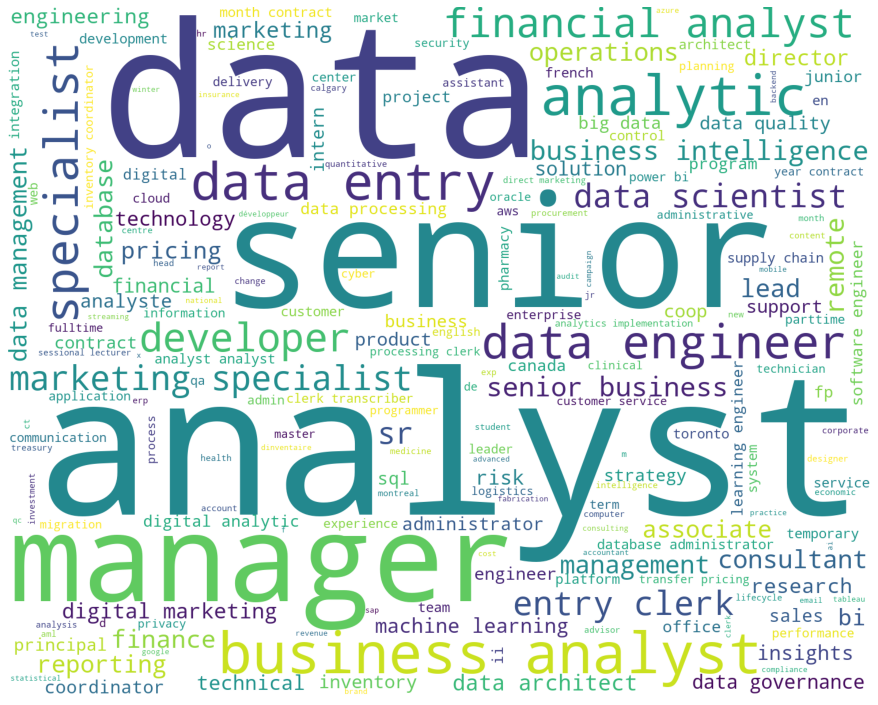

In [10]:
stopwords = set(STOPWORDS) 
wordcloud = WordCloud(width = 1500, height = 1200, 
            background_color ='white', 
            stopwords = stopwords, 
            min_font_size = 10).generate(word_string) 

# plot the WordCloud image                        
plt.figure(figsize = (12, 12), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show()

Displaying the word counts.

We are going to clean up the data a bit, but one thing to note is that becuase "data" is our searched keyword, I am going to remove it from the chart.

Just note that "data" is the technically the most observed word. 

In [11]:
# grouping the data
word_counts = pd.DataFrame(word_string.split(',')).reset_index().groupby(0).count().sort_values(by='index', ascending=False).reset_index()
word_counts.columns = ['Word','Count']

# removing some specific values from our data
word_counts = word_counts[word_counts.Word != '']
word_counts = word_counts[word_counts.Word != '&']
word_counts = word_counts[word_counts.Word != 'and']
word_counts = word_counts[word_counts.Word != 'data']

# changing "sr" to "senior" as they are the same thing
word_counts.Word = word_counts.Word.replace('sr.','senior')
word_counts.Word = word_counts.Word.replace('sr','senior')
word_counts = word_counts.groupby(by='Word').sum().reset_index().sort_values(by='Count', ascending=False)

# taking the top word counts to graph
word_counts = word_counts[:30].sort_values(by="Count")

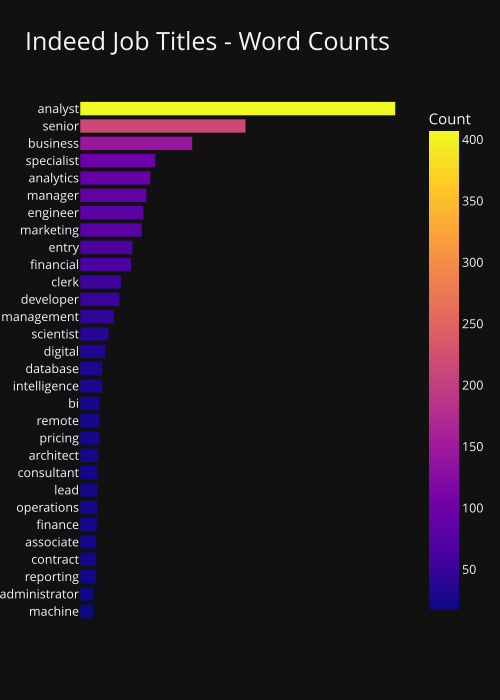

In [12]:
# producing a bar chart with the most common keywords used in our job titles
fig = px.bar(word_counts, y='Word', x='Count',
        width=500, height=700,
        color='Count',
        title='Indeed Job Titles - Word Counts',
        template='plotly_dark')

fig.update_yaxes(title=None)
fig.update_xaxes(title=None, visible=False)
fig.update_layout(
    font_family="Open Sans",
    font_size=12.5,
    title_font_family="Open Sans",
    title_font_size=25)
fig.show('svg')

Besides the word "data" and "analyst", the most interesting words (to me) are:

* senior (or sr.)
* specialist 
* manager

To me, this indicates a larger need for expierienced data professionals, over the "junior" or "entry" level positions. I also assume the word "entry" includes "data entry" as well as "entry-level" postitions.

Next we can compare salaries, for those that have it.

In [13]:
# fixing up the salary column
df['salary_new'] = ''
for i in range(len(df.annual_salary_combined)):
    if df.annual_salary_combined[i] == '':
        df.salary_new[i] = 'missing'
    elif df.annual_salary_combined[i] == 'nan':
        df.salary_new[i] = 'missing'
    else:
        df.salary_new[i] = df.annual_salary_combined[i]

df['max_salary'] = ''
for i in range(len(df.salary_new)):
    try:
        df.max_salary[i] = df.salary_new[i].split(', ')[1].replace(']','').replace('[','')
    except IndexError:
        df.max_salary[i] = None

df['min_salary'] = ''
for i in range(len(df.salary_new)):

    min_sal = df.salary_new[i].split(', ')[0].replace(']','').replace('[','')
    if min_sal == 'missing':
        df.min_salary[i] = None
    else:
        df.min_salary[i] = min_sal
    
df[['salary_new', 'min_salary', 'max_salary']]

# converting to float so values can be quantified
df.max_salary = df.max_salary.astype(float)
df.min_salary = df.min_salary.astype(float)

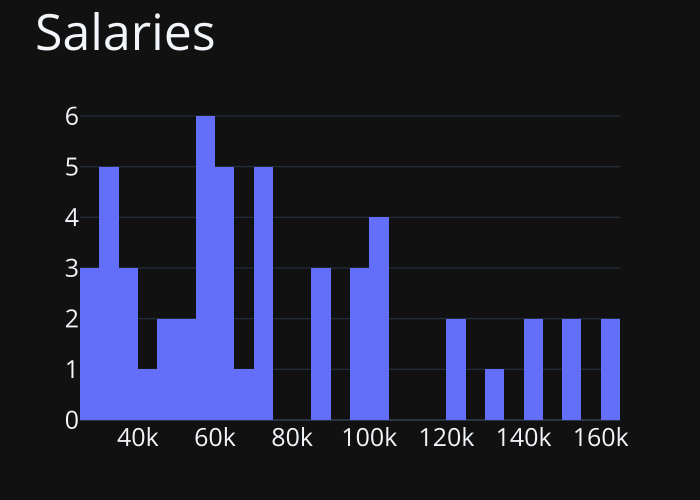

In [14]:

fig = px.histogram(df, x='max_salary',
                title = 'Salaries',
                labels = {'max_salary':'Maximum Salary'},
                template='plotly_dark')

fig.update_yaxes(title=None)
fig.update_xaxes(title=None)
fig.update_layout(
    font_family="Open Sans",
    font_size=25,
    title_font_family="Open Sans",
    title_font_size=50)
fig.show('svg')

Next we can take a look at locations.

In [15]:
# I'll withold some of the cells used to determine this (as it's messy):
# Some locations contain a "+" or "•" to indicate either multiple locations or remote work available.
# We will remove these sections for our location analysis.
df['location_split_1'] = [x[0].replace('-',',') for x in df.location.str.replace(',', '-').str.split('+')]
df['location_split_2'] = [x[0] for x in df.location_split_1.str.split('•')]

# cleaning up some of the extra columns
df.location = df.location_split_2
df = df[['job_title_corrected', 'location', 'company_name', 'footer',
       'remote', 'job_url', 'new_posting', 'max_salary', 'min_salary']]

Each location seems to be in a fairly neat format, also containing the province.

I am visioning a choropleth map with provincial shapefiles, and counts of how many jobs were posted in each province.

# Mapping with Geopandas

I like building maps.

First, I need to isolate the province data so we know which province the job is being posted for.

In [16]:
# Here I am attempting to obtain the province - not all are nicely formatted in the standard two-letter code.
# I will not be able to get all of them, but we should be able to get the vast majority.
# forgive me for what I am about to do
pd.options.mode.chained_assignment = None
df['prov'] = ''
for i in range(len(df)):
    try:
        df.prov.loc[i] = df.location.loc[i].split(',')[1].replace(' ','')
    except IndexError:
        df.prov.loc[i] = df.location.loc[i].replace(
            'Ontario','ON').replace(
                'British Columbia', 'BC').replace(
                    'Quebec Province', 'QC').replace(
                        'Waterloo','ON').replace(
                            'Alberta', 'AB').replace(
                                'Manitoba', 'MB').replace(
                                    'Waterloo', 'ON')

In [17]:
# Brining in the provincial boundary shapefile from Statistics Canada
geo_files_path = 'https://www12.statcan.gc.ca/census-recensement/2011/geo/bound-limit/files-fichiers/2016/lpr_000b16a_e.zip'
r = urlopen(geo_files_path).read()
file = ZipFile(BytesIO(r))
# extracting all the geo files locally
file.extractall()

In [18]:
# reading the locally stored geo-files with geopandas
base_path = os.getcwd()
for f in os.listdir(base_path):
    if '.shp' in f:
        geo_df = gpd.read_file(f'{base_path}\\{f}')

In [19]:
# converting the projection to use in a choropleth map
geo_df.to_crs(pyproj.CRS.from_epsg(4326), inplace=True)

In [20]:
# simplifying the shapefile for faster rendering
geo_df.geometry = geo_df.geometry.simplify(0.005)

In [21]:
# Next we need to create a key to match the two datasets on
# We will convert the PREABBR field to the two-letter province id
geo_df['PROV_KEY'] = np.NaN
for i in range(len(geo_df.PREABBR)):
    row = geo_df.PREABBR[i].replace('.', '').replace(' ','')
    if row == 'PEI':
        geo_df.PROV_KEY[i] = 'PE'
    if row == 'Que':
        geo_df.PROV_KEY[i] = 'QC'
    if row == 'Ont':
        geo_df.PROV_KEY[i] = 'ON'
    if row == 'Man':
        geo_df.PROV_KEY[i] = 'MN'
    if row == 'Sask':
        geo_df.PROV_KEY[i] = 'SK'
    if row == 'NWT':
        geo_df.PROV_KEY[i] = 'NT'
    if row == 'Alta':
        geo_df.PROV_KEY[i] = 'AB'

geo_df['PROV_KEY'] = geo_df['PROV_KEY'].fillna(geo_df.PREABBR.str.replace('.','', regex=False).replace(' ',''))

In [30]:
# merging the datasets
df1 = geo_df[['PROV_KEY', 'geometry']]
df2 = df.prov.value_counts().reset_index()
df2.columns = ['PROV_KEY', 'Count']
df3 = pd.merge(df1, df2, how='left', on='PROV_KEY')
df3.Count.fillna(0, inplace=True)

In [31]:
df3 = df3.set_index('PROV_KEY')

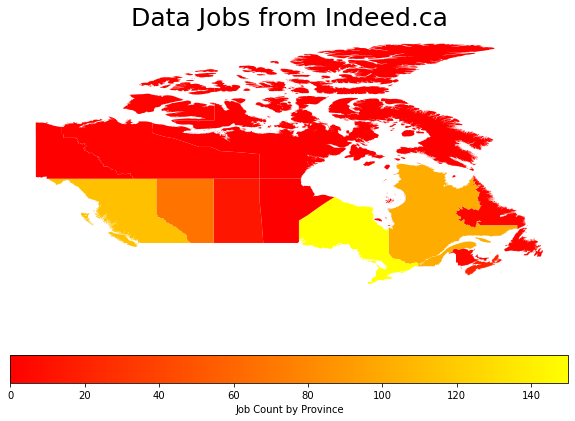

In [33]:
fig = df3.plot(
        column='Count',
        cmap='autumn',
        vmax=150,
        figsize=(10, 7),
        legend=True,
        legend_kwds={'label': "Job Count by Province",
                    'orientation': "horizontal"},
        # style_kwds = {'linewidth': '20'},
        aspect=None
        )

fig.axis('off')
fig.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False)
plt.title('Data Jobs from Indeed.ca', fontsize=25)
plt.show('svg')

This chart looks a little wonky. I could fiddle around with the parameters a little, but I am going to move onto using Plotly Express for higher resolution maps.

Plotly maps render in Javascript, so they look much better. However, due to Github not being able to render the Javascript maps, we are going to convert them into "svg" files instead.

In [25]:
# creating the mapbox plot
fig = px.choropleth(
    df3, geojson = df3.geometry, 
    locations = df3.index,
    color_continuous_scale="Magma", 
    color = df3.Count,
    range_color = (0,150),
    projection="natural earth",
    labels={'Count':'Jobs'}
    )
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

# Here is where we convert the maps to an image. If you run this code yourself and prefer the JS version, simply fig.show()
fig.show('svg')

Now that we have the mapping stuff all sorted, we can easily map out some other variables, such as the average salary per province.

This one will be taken with a grain of salt, as there are not many salaries available.

In [26]:
# creating the average salary by province data
df_as = df.groupby(by='prov').agg({'max_salary':'mean'}).reset_index()
df_as.columns = ['Province', 'Average_Salary']
df_as = df_as[df_as.Province != '']

In [27]:
# merging the datasets
df1 = geo_df[['PROV_KEY', 'geometry']]
df1.columns = ['Province', 'Count']
df2 = df_as.copy()
df3 = pd.merge(df1, df2, how='left', on='Province')
df3.Average_Salary.fillna(0, inplace=True)
df3.Average_Salary = df3.Average_Salary.astype(float)
df3.set_index('Province', inplace=True)
df3.columns = ['geometry', 'average_salary']

In [28]:
# creating the mapbox plot
fig = px.choropleth(
    df3, geojson = df3.geometry, 
    locations = df3.index,
    color_continuous_scale="Viridis", 
    color = df3.average_salary,
    range_color = (min(df.max_salary),max(df.max_salary)),
    projection="natural earth",
    labels={'average_salary':'Average Salary'}
    )
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show('svg')